### EDA - Vehicle DF

In [2]:
# import necessary packages
import pandas as pd
import streamlit as st
import plotly.express as px
import altair as alt

In [3]:
# read in data file
vehicle_df = pd.read_csv(r"C:\Users\lewis\OneDrive\Documents\WebAppProject\vehicles_us.csv")

In [4]:
# get general information of data file
vehicle_df.info()
vehicle_df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64

In [9]:
vehicle_df.duplicated().sum()

0

In [6]:
# in is_4wd column 1 = yes, changing missing values to 0 to mean no/unknown
vehicle_df['is_4wd'].fillna(0, inplace=True)

C:\Users\lewis\AppData\Local\Temp\ipykernel_5716\3587259134.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  vehicle_df['is_4wd'].fillna(0, inplace=True)


In [7]:
# get general info about model year column
vehicle_df['model_year'].describe()

count    47906.000000
mean      2009.750470
std          6.282065
min       1908.000000
25%       2006.000000
50%       2011.000000
75%       2014.000000
max       2019.000000
Name: model_year, dtype: float64

In [8]:
fig = px.box(vehicle_df, y= 'model_year')
fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

There are quite a few outliers in the 1900s, while most vehicles are in the 2000s. 

In [ ]:
# fill missing values with model year median
vehicle_df['model_year'] = vehicle_df['model_year'].fillna(2011).astype('int')

In [ ]:
# get general info about cylinder column
vehicle_df['cylinders'].describe()

count    46265.000000
mean         6.125235
std          1.660360
min          3.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         12.000000
Name: cylinders, dtype: float64

In [ ]:
vehicle_df['cylinders'].value_counts()

cylinders
8.0     15844
6.0     15700
4.0     13864
10.0      549
5.0       272
3.0        34
12.0        2
Name: count, dtype: int64

this portion shows 8 cylinders is the most common in the data set

In [ ]:
# filling in missing values in cylinder column with 8
vehicle_df['cylinders'].fillna(8, inplace=True)

In [ ]:
#getting general info on odometer column
vehicle_df['odometer'].describe()

count     43633.000000
mean     115553.461738
std       65094.611341
min           0.000000
25%       70000.000000
50%      113000.000000
75%      155000.000000
max      990000.000000
Name: odometer, dtype: float64

In [ ]:
#filling missing values with median (113000)
vehicle_df['odometer'].fillna(113000, inplace=True)

In [ ]:
#filling missing values in paint color to unknown
vehicle_df['paint_color'].fillna('unknown', inplace=True)

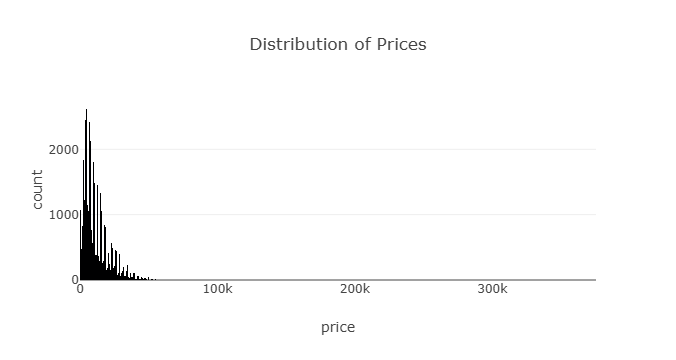

In [ ]:
#creating histogram to show distribution of car prices
odo_dis = px.histogram(vehicle_df, x= 'price', title= 'Distribution of Prices')
odo_dis.show()

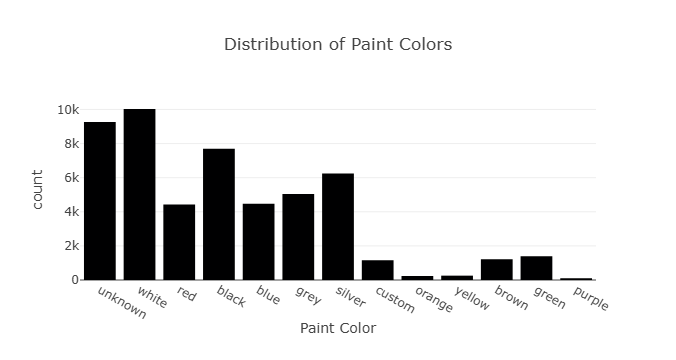

In [ ]:
# creating histogram to show ditribution of paint colors
col_dis = px.histogram(vehicle_df, x= 'paint_color', title= 'Distribution of Paint Colors', labels= {'paint_color':'Paint Color'})
col_dis.show()

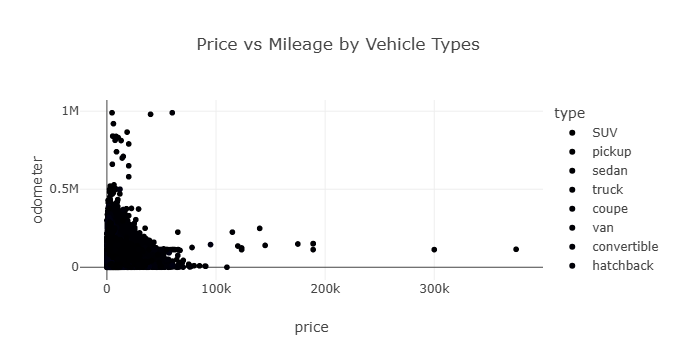

In [ ]:
# showing price vs mileage between vehicle types
pr_od_typ = px.scatter(vehicle_df, x= 'price', y= 'odometer', color= 'type', title= 'Price vs Mileage by Vehicle Types')
pr_od_typ.show()

The different scatterplots above shows that the more miles on the vehicle (all types), the cheaper the price.

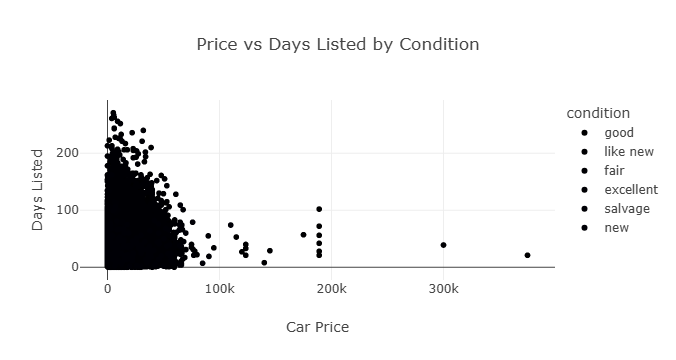

In [ ]:
# showing price vs days listed between different conditions
pr_listed_con = px.scatter(vehicle_df, x='price', y= 'days_listed', color = 'condition', title= 'Price vs Days Listed by Condition', labels= {'price':'Car Price', 'days_listed':'Days Listed'})
pr_listed_con.show()

New and salvage cars don't have much coorelation between prices and days listed. The other conditions show the longer its listed the cheaper the price.

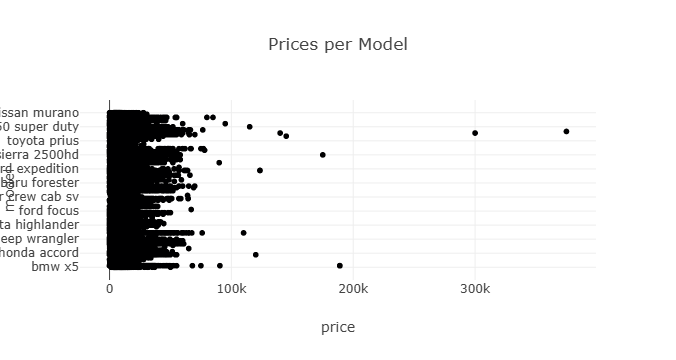

In [ ]:
pr_vs_mo = px.scatter(vehicle_df, x='price', y= 'model', title= 'Prices per Model')
pr_vs_mo.show()